# We have the problem that wind forcing seems to dominate changes to modal decomposition, rather than topo shape!

## In this notebook, compare the same time slices over 100hr average. Focus on mode 1. Make movies maybe?

In [1]:
import sys
sys.path.append("/home/149/ab8992/tasman-tides/")
import xarray as xr
import ttidelib as tt
import scipy
import cmocean
import os
from pathlib import Path
cmap = cmocean.cm.dense_r
import matplotlib
import matplotlib.pyplot as plt
earth_cmap = matplotlib.colormaps["gist_earth"]
from datetime import timedelta

# import filtering
import numpy as np
import dask
dask.config.set({'logging.distributed': 'error'})
from dask.distributed import Client,default_client
import xrft


client = tt.startdask()
client

/g/data/hh5/public/apps/miniconda3/envs/analysis3-24.04/lib/python3.10/site-packages/distributed/node.py:182: UserWarning: Port 8787 is already in use.
Perhaps you already have a cluster running?
Hosting the HTTP server on port 35775 instead
  warnings.warn(


<Client: 'tcp://127.0.0.1:33265' processes=7 threads=28, memory=112.00 GiB>


Connection method: Cluster object,Cluster type: distributed.LocalCluster
Dashboard: /proxy/35775/status,
Dashboard: /proxy/35775/status,Workers: 7
Total threads: 28,Total memory: 112.00 GiB
Status: running,Using processes: True
Comm: tcp://127.0.0.1:33265,Workers: 7
Dashboard: /proxy/35775/status,Total threads: 28
Started: Just now,Total memory: 112.00 GiB
Comm: tcp://127.0.0.1:33447,Total threads: 4
Dashboard: /proxy/37027/status,Memory: 16.00 GiB
Nanny: tcp://127.0.0.1:40011,


## First draft a function to calculate N(z)

$ \large N = \frac{-g}{\rho}\frac{\partial \rho}{\partial z} $


In [2]:
def get_bandpass(expt,t0):
    highpass = tt.collect_data(
                exptname=expt,
                lfiltered = f"{t0}-highpass"
            ).sel(yb = slice(-120,120)).chunk({"xb":-1,"time":-1,"xb" : 50,"yb" : 50})
    lowpass = tt.collect_data(
                exptname=expt,
                lfiltered = f"{t0}-lowpass"
            ).sel(yb = slice(-120,120)).chunk({"xb":-1,"time":-1,"xb" : 50,"yb" : 50})

    u = lowpass.u - highpass.u
    v = lowpass.v - highpass.v
    cst = lowpass.cst - highpass.cst
    out = xr.merge([u.rename("u"),v.rename("v"),cst.rename("cst"),lowpass.bathy])
    out.assign_coords(
        {"time":lowpass.time * 3600,
         "xb":lowpass.xb * 1000,
         "yb":lowpass.yb * 1000}
    )
    return out

full20_1 = get_bandpass("full-20","40000")
full20_2 = get_bandpass("full-20","35560")
full20_3 = get_bandpass("full-20","10000")
efunc2 = xr.open_dataset("/g/data/nm03/ab8992/postprocessed/full-20/VerticalEigenfunctions-35560.nc").chunk({"zl":-1,"xb" : 50,"yb" : 50})
efunc1 = xr.open_dataset("/g/data/nm03/ab8992/postprocessed/full-20/VerticalEigenfunctions-40000.nc").chunk({"zl":-1,"xb" : 50,"yb" : 50})
efunc3 = xr.open_dataset("/g/data/nm03/ab8992/postprocessed/full-20/VerticalEigenfunctions.nc").chunk({"zl":-1,"xb" : 50,"yb" : 50})

Timerange as inferred from lfiltered data: (39950.0, 40049.0)
Timerange as inferred from lfiltered data: (39950.0, 40049.0)
Timerange as inferred from lfiltered data: (35510.0, 35609.0)
Timerange as inferred from lfiltered data: (35510.0, 35609.0)
Timerange as inferred from lfiltered data: (9950.0, 10049.0)
Timerange as inferred from lfiltered data: (9950.0, 10049.0)


0
	 0
	 1
	 2
1
	 0
	 1
	 2
2
	 0
	 1
	 2


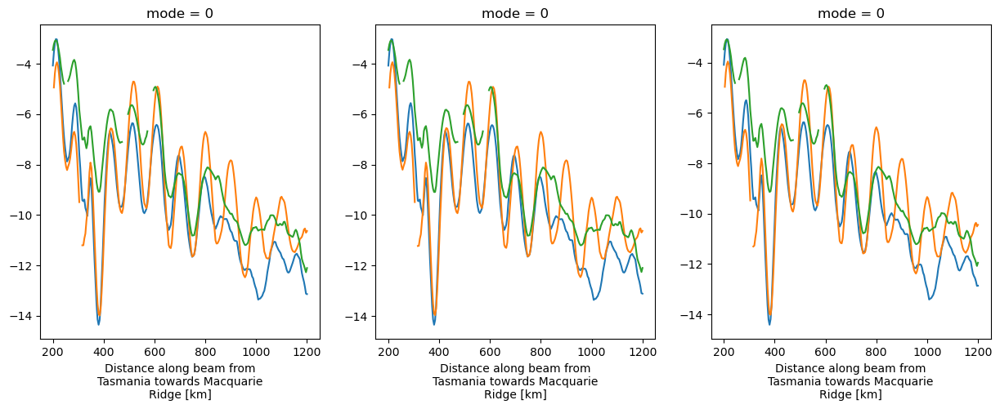

In [ ]:
def getKE(efunc,data):
    KE = (efunc.U * data.u).fillna(0).integrate("zl")**2
    KE += (efunc.U * data.v).fillna(0).integrate("zl")**2
    KE /= data.bathy
    return KE.sel(xb = slice(200,1200)).integrate("yb").integrate("time").isel(mode = 0).load()

fig,ax = plt.subplots(1,3,figsize=(15,5))

for j,efunc in enumerate([efunc1,efunc2,efunc3]):
    print(j)
    KE1 = getKE(efunc, full20_1)
    KE3 = getKE(efunc, full20_3)
    KE2 = getKE(efunc, full20_2)
    for i,KE in enumerate([KE1,KE2,KE3]):
        print("\t",i)
        KE.plot(ax=ax[j],label = i)


    

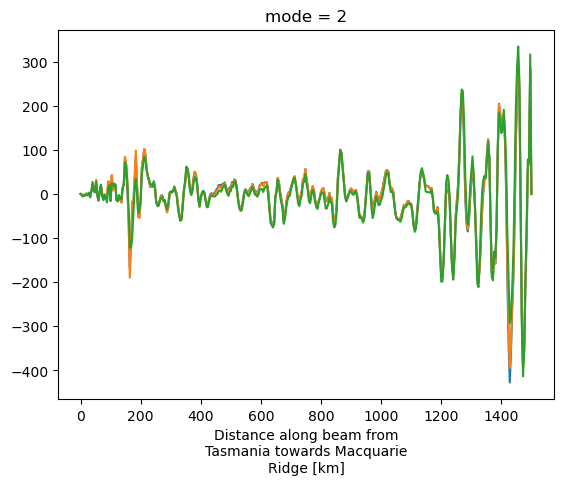

In [3]:
(efunc1.U * full20_1.u).fillna(0).isel(mode = 2).integrate("yb").integrate("zl").integrate("time").plot()
(efunc2.U * full20_1.u).fillna(0).isel(mode = 2).integrate("yb").integrate("zl").integrate("time").plot()
(efunc3.U * full20_1.u).fillna(0).isel(mode = 2).integrate("yb").integrate("zl").integrate("time").plot()

/g/data/hh5/public/apps/miniconda3/envs/analysis3-24.04/lib/python3.10/site-packages/distributed/client.py:3357: UserWarning: Sending large graph of size 9.88 MiB.
This may cause some slowdown.
Consider scattering data ahead of time and using futures.
  warnings.warn(
/g/data/hh5/public/apps/miniconda3/envs/analysis3-24.04/lib/python3.10/site-packages/distributed/client.py:3357: UserWarning: Sending large graph of size 9.88 MiB.
This may cause some slowdown.
Consider scattering data ahead of time and using futures.
  warnings.warn(
/g/data/hh5/public/apps/miniconda3/envs/analysis3-24.04/lib/python3.10/site-packages/distributed/client.py:3357: UserWarning: Sending large graph of size 9.88 MiB.
This may cause some slowdown.
Consider scattering data ahead of time and using futures.
  warnings.warn(


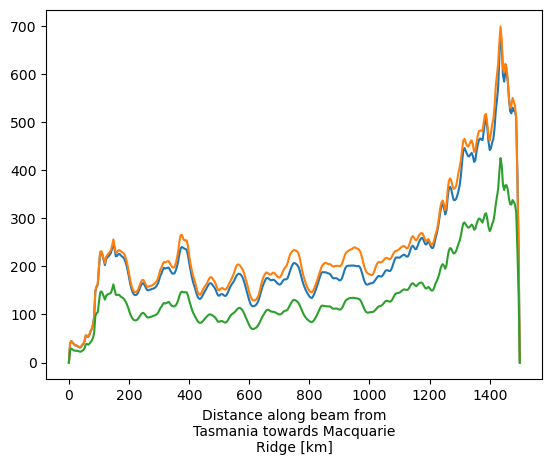

In [5]:
((efunc1.U * full20_2.u)**2 + (efunc1.U * full20_2.v)**2).fillna(0).sum("mode").integrate("yb").integrate("zl").integrate("time").plot()
((efunc2.U * full20_2.u)**2 + (efunc2.U * full20_2.v)**2).fillna(0).sum("mode").integrate("yb").integrate("zl").integrate("time").plot()
((efunc3.U * full20_2.u)**2 + (efunc3.U * full20_2.v)**2).fillna(0).sum("mode").integrate("yb").integrate("zl").integrate("time").plot()

/g/data/hh5/public/apps/miniconda3/envs/analysis3-24.04/lib/python3.10/site-packages/distributed/client.py:3357: UserWarning: Sending large graph of size 9.86 MiB.
This may cause some slowdown.
Consider scattering data ahead of time and using futures.
  warnings.warn(
/g/data/hh5/public/apps/miniconda3/envs/analysis3-24.04/lib/python3.10/site-packages/distributed/client.py:3357: UserWarning: Sending large graph of size 9.86 MiB.
This may cause some slowdown.
Consider scattering data ahead of time and using futures.
  warnings.warn(
/g/data/hh5/public/apps/miniconda3/envs/analysis3-24.04/lib/python3.10/site-packages/distributed/client.py:3357: UserWarning: Sending large graph of size 9.86 MiB.
This may cause some slowdown.
Consider scattering data ahead of time and using futures.
  warnings.warn(


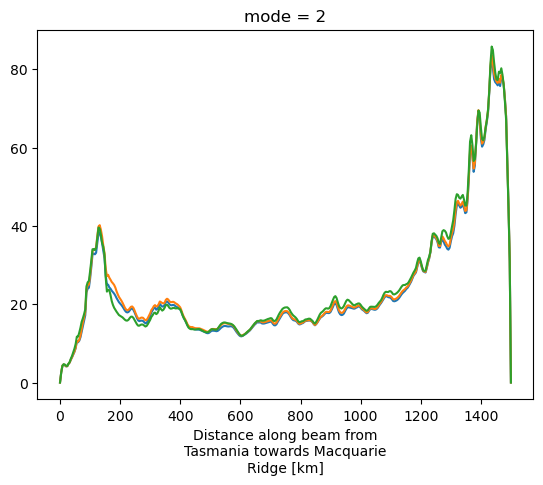

In [4]:
((efunc1.U * full20_3.u)**2 + (efunc1.U * full20_3.v)**2).fillna(0).isel(mode = 2).integrate("yb").integrate("zl").integrate("time").plot()
((efunc2.U * full20_3.u)**2 + (efunc2.U * full20_3.v)**2).fillna(0).isel(mode = 2).integrate("yb").integrate("zl").integrate("time").plot()
((efunc3.U * full20_3.u)**2 + (efunc3.U * full20_3.v)**2).fillna(0).isel(mode = 2).integrate("yb").integrate("zl").integrate("time").plot()

## CST

In [41]:
## Load in the eigenfunctions


efunc = xr.open_dataset("/g/data/nm03/ab8992/postprocessed/full-40/5modeonlyVerticalEigenfunctions.nc").chunk({"zl":-1,"xb" : 50,"yb" : 50})
U_bandpass  = (efunc.U * u).fillna(0).integrate("zl").load() 
V_bandpass  = (efunc.U * v).fillna(0).integrate("zl").load()
U_lowpass  = (efunc.U * lowpass.u).fillna(0).integrate("zl").load() 
V_lowpass  = (efunc.U * lowpass.v).fillna(0).integrate("zl").load()

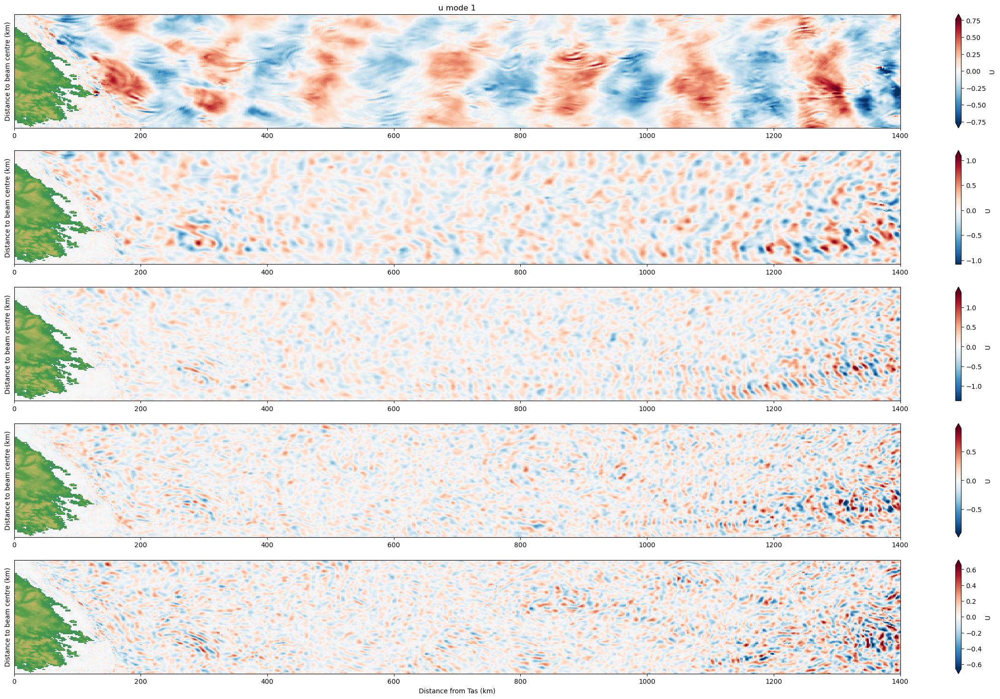

In [ ]:
def PlotVmodes(data):
    fig,ax = plt.subplots(5,1,figsize = (30,18))

    for i in range(len(data.mode)):

        tp = data.U.isel(mode = i).sel(xb = slice(0,1400))
        vm = 0.7 * np.max(np.abs(tp))
        tp.plot(ax = ax[i],vmin = -1 * vm,vmax = vm,cmap = "RdBu_r")

        tt.plot_topo(ax[i],bathy = data.bathy)
        tt.plot_topo(ax[i],bathy = data.bathy)
        ax[i].set_xlim(0,1400)
        ax[i].set_xlim(0,1400)
        ax[i].set_title("")
        ax[i].set_title("")
        ax[i].set_xlabel("")
        ax[i].set_ylabel("")
        ax[i].set_yticks([])
        ax[i].set_xlabel("")
        ax[i].set_ylabel("Distance to beam centre (km)")
        ax[i].set_aspect('auto')
        ax[i].set_aspect('auto')

    ax[-1].set_xlabel("Distance from Tas (km)")
    ax[-1].set_xlabel("Distance from Tas (km)")
    fig.subplots_adjust(wspace=0.01)
    ax[0].set_title("u mode 1")
    # ax[0].set_title("v mode 1")
    return fig

PlotVmodes(xr.merge([U_bandpass.rename("U"),V_bandpass.rename("V"),lowpass.bathy.rename("bathy")]).isel(time = 50))
PlotVmodes(xr.merge([U_lowpass.rename("U"),V_lowpass.rename("V"),lowpass.bathy.rename("bathy")]).isel(time = 50))
PlotVmodes(xr.merge([(U_bandpass - U_lowpass).rename("U"),(V_bandpass - V_lowpass).rename("V"),lowpass.bathy.rename("bathy")]).isel(time = 50))

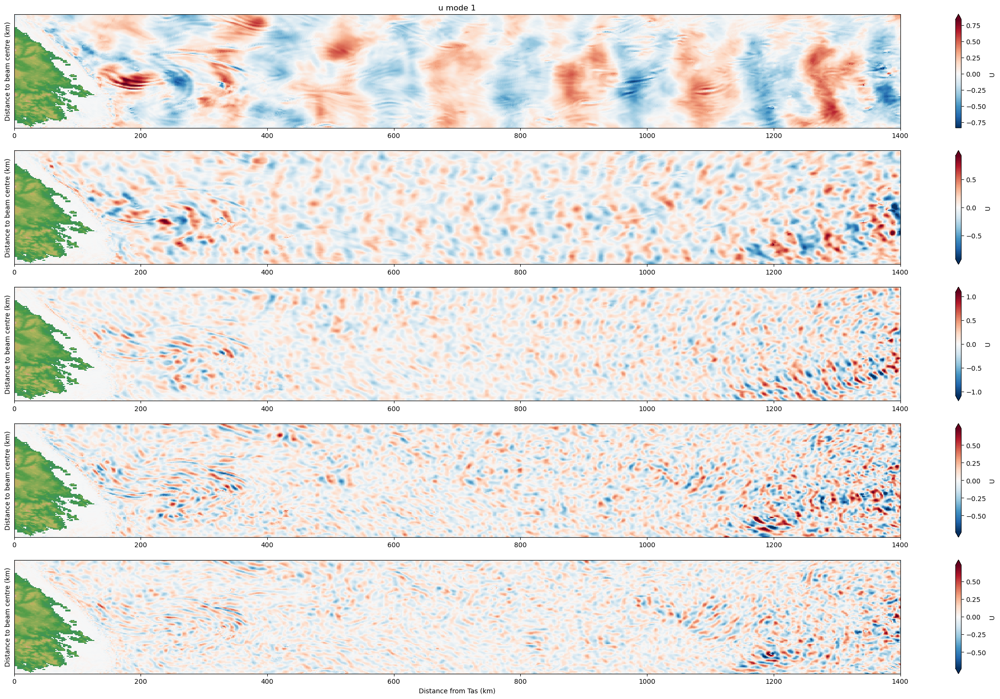

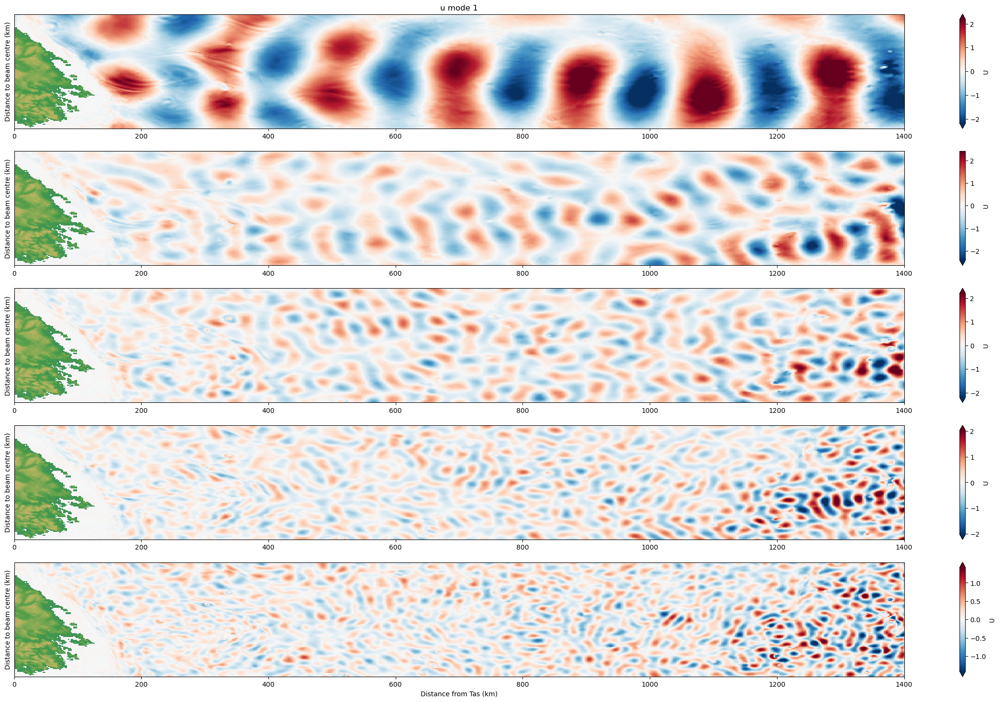

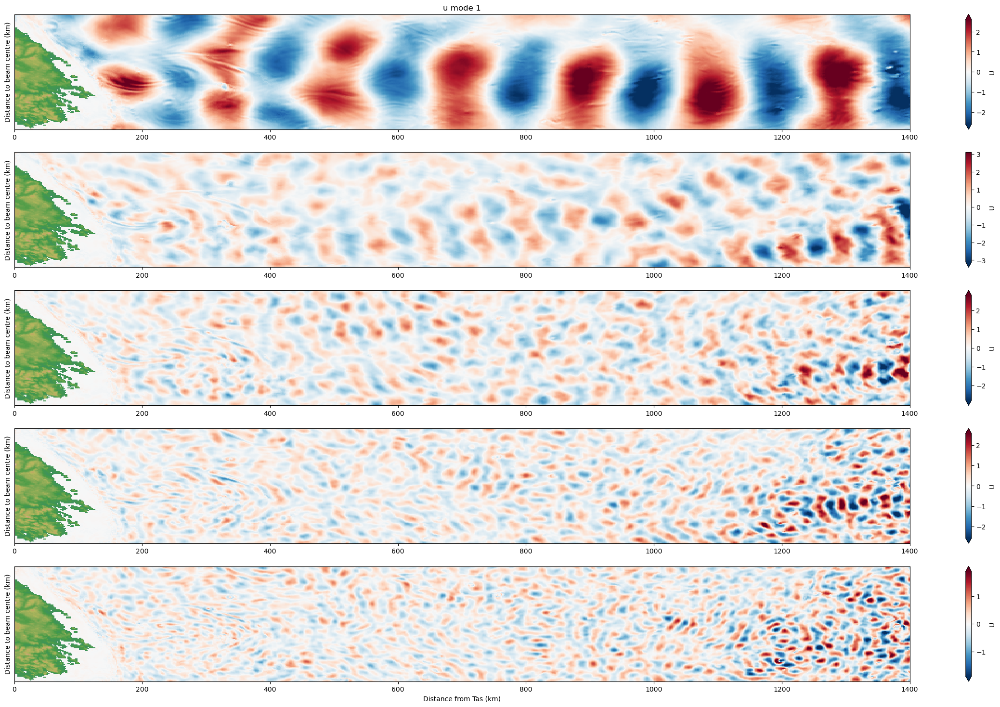

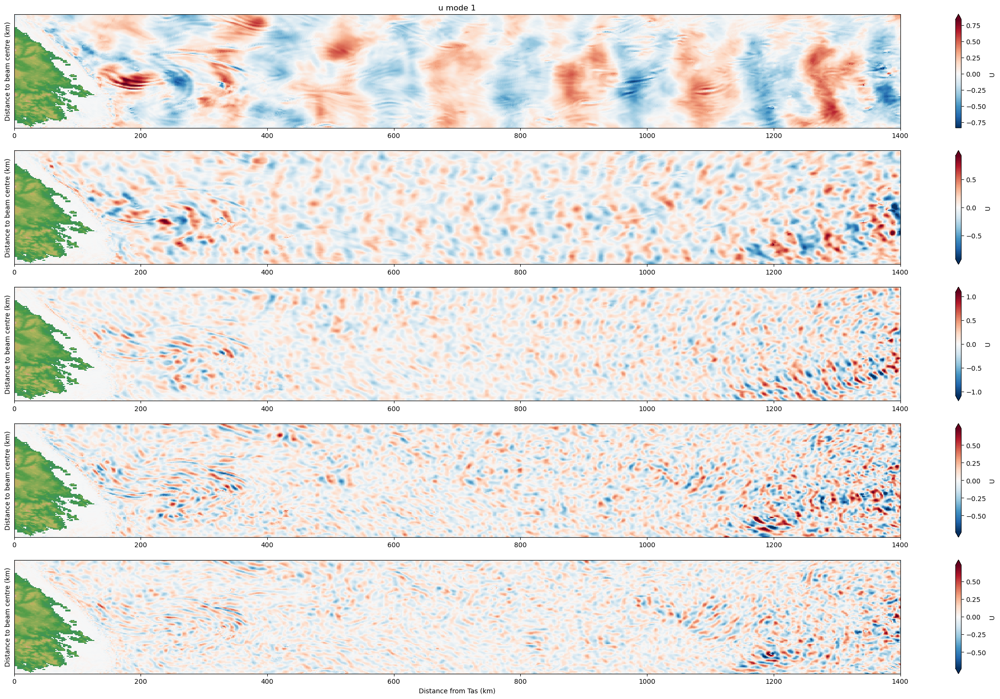

In [22]:
def PlotVmodes(data):
    fig,ax = plt.subplots(5,1,figsize = (30,18))

    for i in range(len(data.mode)):

        tp = data.U.isel(mode = i).sel(xb = slice(0,1400))
        vm = 0.7 * np.max(np.abs(tp))
        tp.plot(ax = ax[i],vmin = -1 * vm,vmax = vm,cmap = "RdBu_r")

        tt.plot_topo(ax[i],bathy = data.bathy)
        tt.plot_topo(ax[i],bathy = data.bathy)
        ax[i].set_xlim(0,1400)
        ax[i].set_xlim(0,1400)
        ax[i].set_title("")
        ax[i].set_title("")
        ax[i].set_xlabel("")
        ax[i].set_ylabel("")
        ax[i].set_yticks([])
        ax[i].set_xlabel("")
        ax[i].set_ylabel("Distance to beam centre (km)")
        ax[i].set_aspect('auto')
        ax[i].set_aspect('auto')

    ax[-1].set_xlabel("Distance from Tas (km)")
    ax[-1].set_xlabel("Distance from Tas (km)")
    fig.subplots_adjust(wspace=0.01)
    ax[0].set_title("u mode 1")
    # ax[0].set_title("v mode 1")
    return fig

PlotVmodes(xr.merge([-1 * U_bandpass.rename("U"),-1 * V_bandpass.rename("V"),lowpass.bathy.rename("bathy")]).isel(time = 50))
PlotVmodes(xr.merge([U_lowpass.rename("U"),V_lowpass.rename("V"),lowpass.bathy.rename("bathy")]).isel(time = 50))
PlotVmodes(xr.merge([(U_bandpass + U_lowpass).rename("U"),(V_bandpass + V_lowpass).rename("V"),lowpass.bathy.rename("bathy")]).isel(time = 50))


## Now check KE slopes taking into account bandpass and vertical means

/g/data/hh5/public/apps/miniconda3/envs/analysis3-24.04/lib/python3.10/site-packages/distributed/client.py:3357: UserWarning: Sending large graph of size 346.66 MiB.
This may cause some slowdown.
Consider scattering data ahead of time and using futures.
  warnings.warn(
/g/data/hh5/public/apps/miniconda3/envs/analysis3-24.04/lib/python3.10/site-packages/distributed/client.py:3357: UserWarning: Sending large graph of size 346.66 MiB.
This may cause some slowdown.
Consider scattering data ahead of time and using futures.
  warnings.warn(
/g/data/hh5/public/apps/miniconda3/envs/analysis3-24.04/lib/python3.10/site-packages/distributed/client.py:3357: UserWarning: Sending large graph of size 346.66 MiB.
This may cause some slowdown.
Consider scattering data ahead of time and using futures.
  warnings.warn(
/g/data/hh5/public/apps/miniconda3/envs/analysis3-24.04/lib/python3.10/site-packages/distributed/client.py:3357: UserWarning: Sending large graph of size 346.66 MiB.
This may cause some s

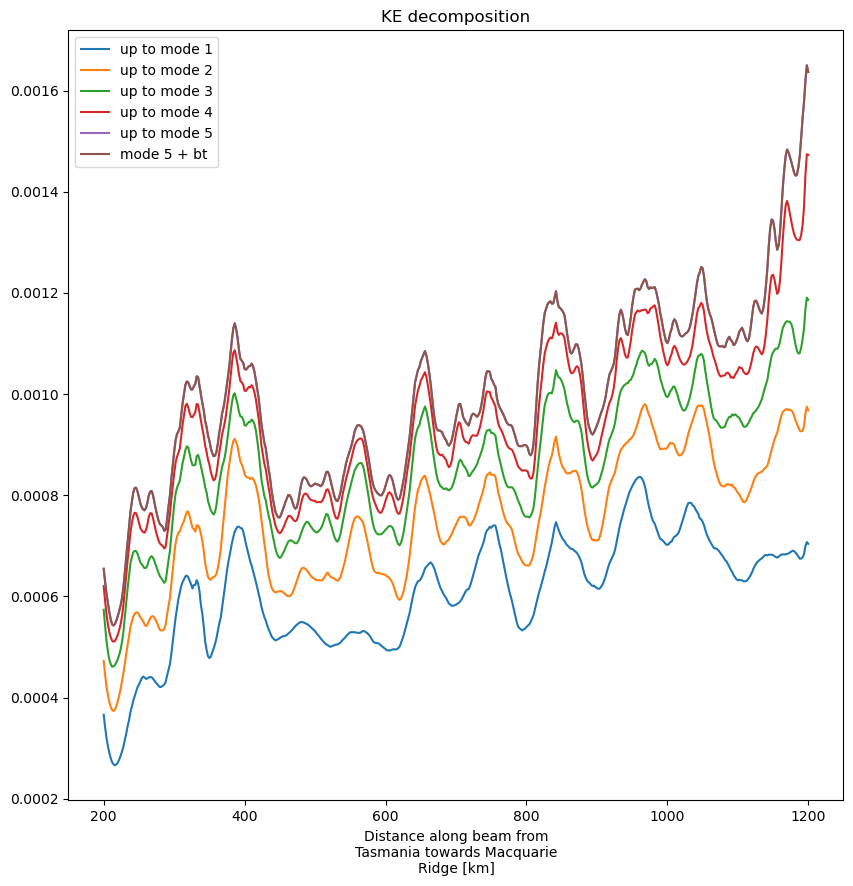

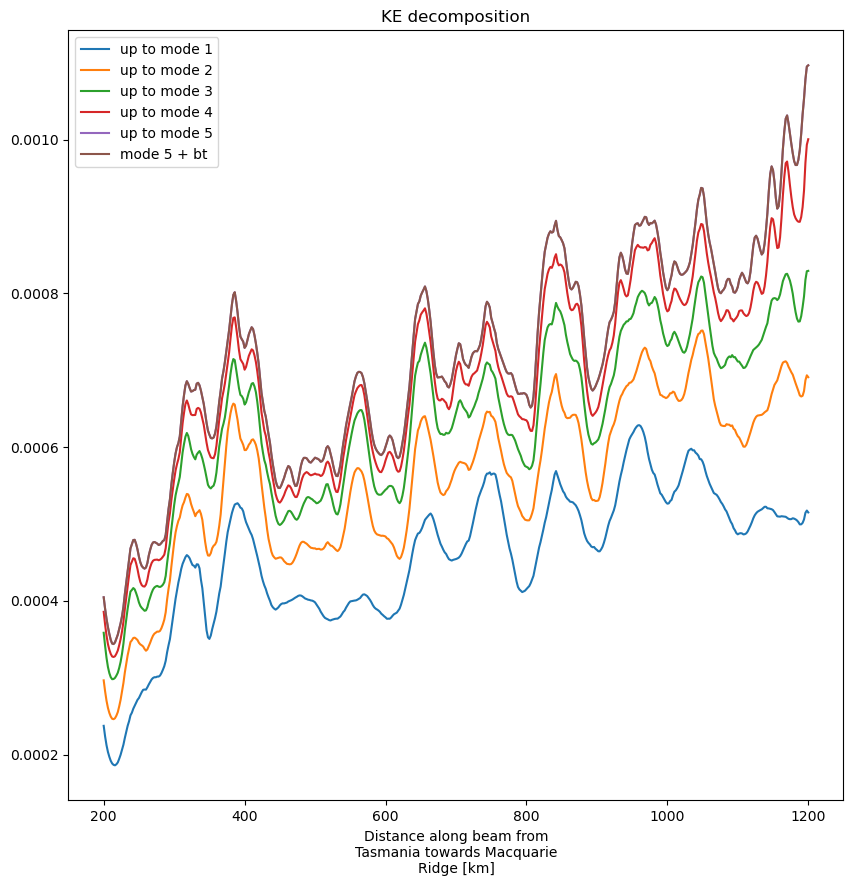

In [27]:
def KE_decomp(data):
    fig,ax = plt.subplots(1,figsize = (10,10))
    H = data.bathy

    ## These will be energies averaged over depth

    ke = (
        (data.U**2 + data.V**2) / np.abs(H)
        ).mean("yb").mean("time").cumsum("mode")
    # ke_true = (
    #     (data.u.fillna(0)**2 + data.v.fillna(0)**2) /H
    #     ).mean("yb").mean("time").integrate("zl").load()
    # H = np.abs(data.data.bathy)
    # ubt = data.data.u.fillna(0).integrate("zl")/H
    # vbt = data.data.v.fillna(0).integrate("zl")/H

    # ke_bt = ((ubt**2 + vbt**2)).mean("yb").mean("time") # The divsion by H makes it match vertical averages

    # ke_bt = ((to_process[expt]["data"].u.integrate("zl")/to_process[expt]["data"].bathy)**2 + (to_process[expt]["data"].v.integrate("zl")/to_process[expt]["data"].bathy)**2).mean("yb").mean("time")
    ke_bt = 0
    for i in range(5):
        ke.isel(mode = i).sel(xb = slice(200,1200)).plot(ax = ax,label = f"up to mode {1+ i}")

    (ke.isel(mode = -1) + ke_bt).sel(xb = slice(200,1200)).plot(ax = ax,label = f"mode 5 + bt")
    # ke_true.sel(xb = slice(200,1200)).plot(ax = ax,color = "black",linestyle = "--",label = "TRUE")
    ax.set_xlim
    ax.legend()
    ax.set_title(f"KE decomposition")

KE_decomp(xr.merge([U_lowpass.rename("U"),V_lowpass.rename("V"),lowpass.bathy.rename("bathy")]))
KE_decomp(xr.merge([U_bandpass.rename("U"),V_bandpass.rename("V"),lowpass.bathy.rename("bathy")]))


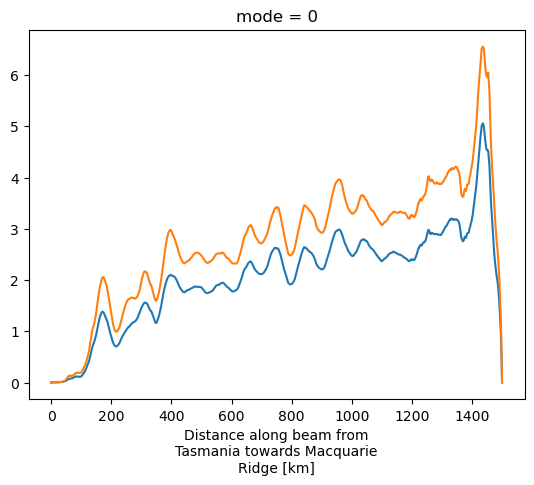

In [38]:
(U_bandpass**2 + V_bandpass**2).mean("time").mean("yb").isel(mode = 0).plot()
(U_lowpass**2 + V_lowpass**2).mean("time").mean("yb").isel(mode = 0).plot()

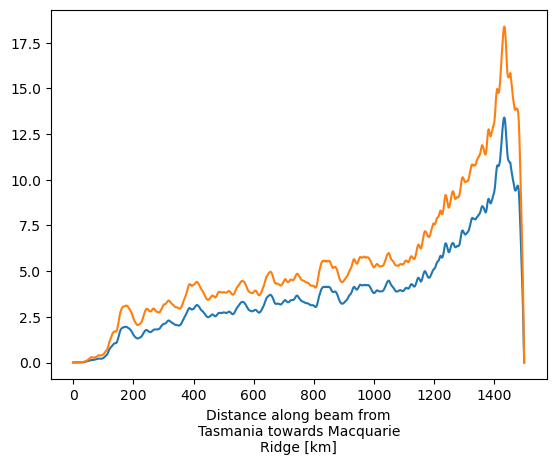

In [32]:
(U_bandpass**2 + V_bandpass**2).mean("time").mean("yb").sum("mode").plot()
(U_lowpass**2 + V_lowpass**2).mean("time").mean("yb").sum("mode").plot()

## Check general conservation of energy:

/g/data/hh5/public/apps/miniconda3/envs/analysis3-24.04/lib/python3.10/site-packages/distributed/client.py:3357: UserWarning: Sending large graph of size 87.50 MiB.
This may cause some slowdown.
Consider scattering data ahead of time and using futures.
  warnings.warn(
HDF5-DIAG: Error detected in HDF5 (1.14.3) thread 0:
  #000: H5D.c line 611 in H5Dget_space(): unable to synchronously get dataspace
    major: Dataset
    minor: Can't get value
  #001: H5D.c line 571 in H5D__get_space_api_common(): invalid dataset identifier
    major: Invalid arguments to routine
    minor: Inappropriate type
2024-12-18 14:34:35,316 - distributed.worker - WARNING - Compute Failed
Key:       ('concatenate-open_dataset-u-getitem-f48ecd2c651a6ded245dcc566e735a0b', 6, 37, 0, 0)
State:     executing
Function:  getter
args:      (ImplicitToExplicitIndexingAdapter(array=CopyOnWriteArray(array=LazilyIndexedArray(array=<xarray.backends.netCDF4_.NetCDF4ArrayWrapper object at 0x147760ee8dc0>, key=BasicIndexer((s

RuntimeError: NetCDF: HDF error

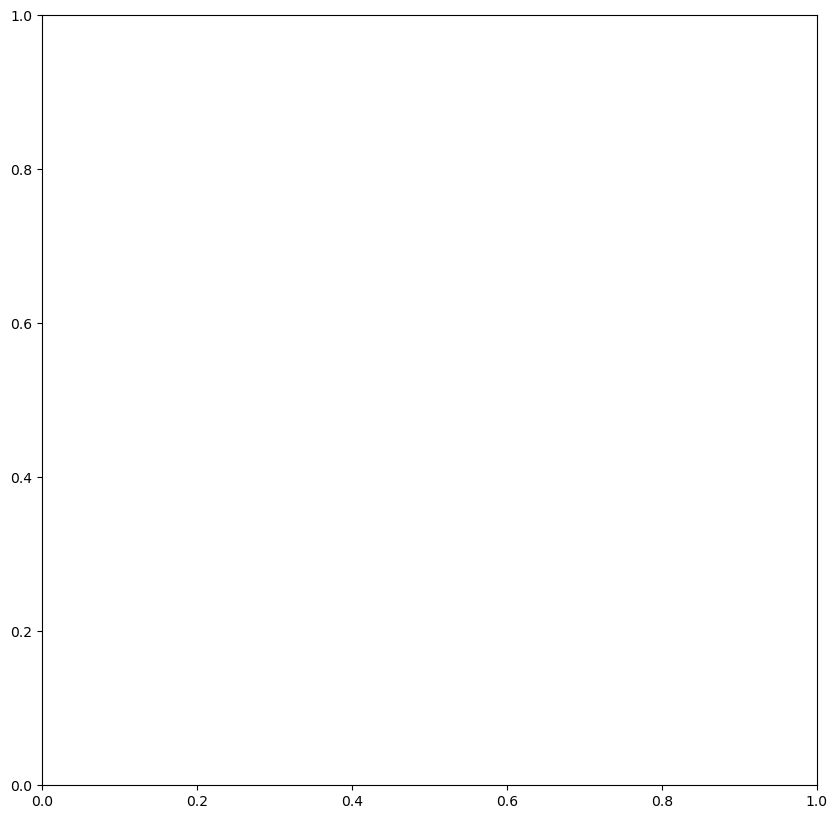

In [ ]:
# def getBT(data):

for expt in ["full-20-1","ideal-20","full-40","smooth-20"]:
    fig,ax = plt.subplots(1,figsize = (10,10))
    H = np.abs(to_process[expt]["data"].bathy)

    ## These will be energies averaged over depth

    ke = (
        (to_process[expt]["U"]**2 + to_process[expt]["V"]**2) / H
        ).mean("yb").mean("time").cumsum("mode")
    ke_true = (
        (to_process[expt]["data"].u.fillna(0)**2 + to_process[expt]["data"].v.fillna(0)**2) /H
        ).mean("yb").mean("time").integrate("zl")
    H = np.abs(to_process[expt]["data"].bathy)
    ubt = to_process[expt]["data"].u.fillna(0).integrate("zl")/H
    vbt = to_process[expt]["data"].v.fillna(0).integrate("zl")/H

    ke_bt = ((ubt**2 + vbt**2) * H).mean("yb").mean("time") / H # The divsion by H makes it match vertical averages

    # ke_bt = ((to_process[expt]["data"].u.integrate("zl")/to_process[expt]["data"].bathy)**2 + (to_process[expt]["data"].v.integrate("zl")/to_process[expt]["data"].bathy)**2).mean("yb").mean("time")

    for i in range(5):
        ke.isel(mode = i).sel(xb = slice(200,1200)).plot(ax = ax,label = f"up to mode {1+ i}")

    (ke.isel(mode = -1) + ke_bt).sel(xb = slice(200,1200)).plot(ax = ax,label = f"{expt} mode 5 + bt")
    ke_true.sel(xb = slice(200,1200)).plot(ax = ax,color = "black",linestyle = "--",label = "TRUE")
    ax.set_xlim
    ax.legend()
    ax.set_title(f"KE decomposition {expt}")

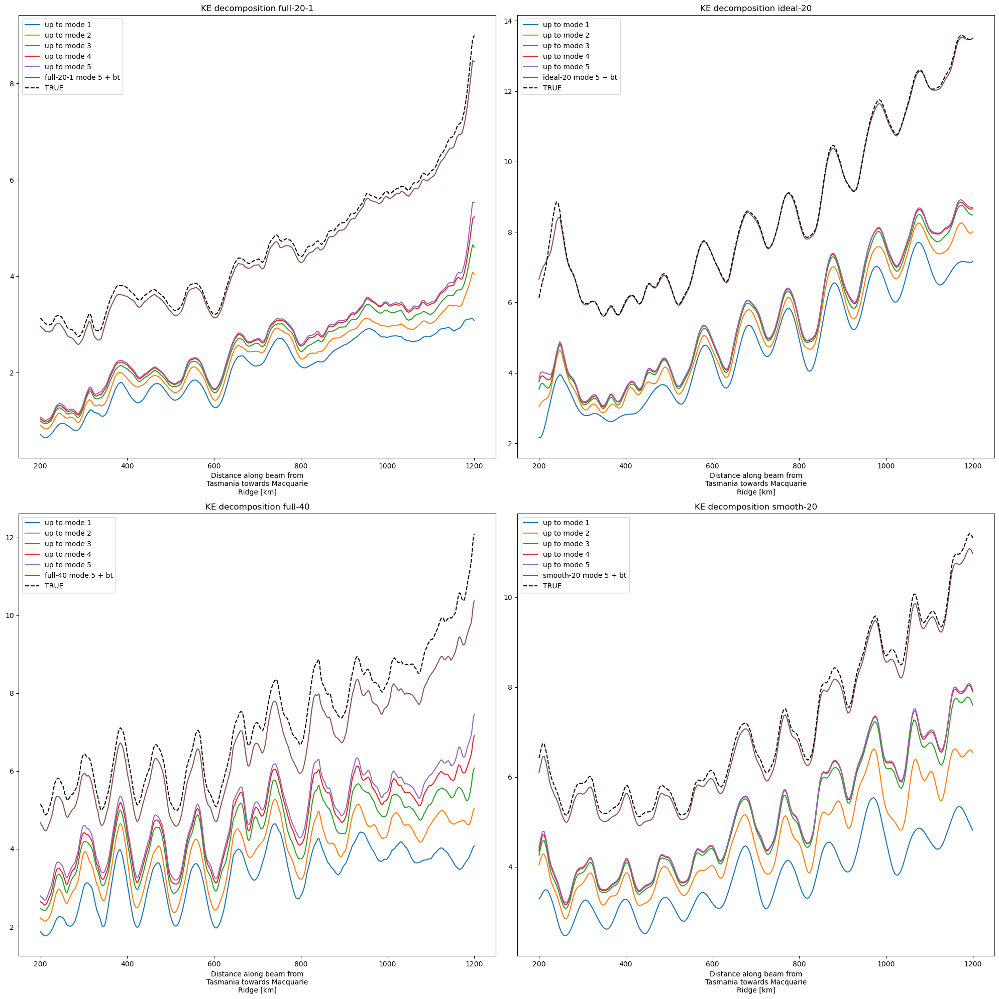

In [54]:
import matplotlib.pyplot as plt

# Create a 2x2 grid of plots
fig, axes = plt.subplots(2, 2, figsize=(20, 20))
axes = axes.flatten()  # Flatten the 2x2 grid to easily iterate over it

for idx, expt in enumerate(["full-20-1", "ideal-20", "full-40", "smooth-20"]):
    ax = axes[idx]  # Select the current axis

    ke = (to_process[expt]["U"]**2 + to_process[expt]["V"]**2).mean("yb").mean("time").cumsum("mode")
    ke_true = (to_process[expt]["data"].u.fillna(0)**2 + to_process[expt]["data"].v.fillna(0)**2).mean("yb").mean("time").integrate("zl")
    H = np.abs(to_process[expt]["data"].bathy)
    ubt = to_process[expt]["data"].u.fillna(0).integrate("zl") / H
    vbt = to_process[expt]["data"].v.fillna(0).integrate("zl") / H

    ke_bt = ((ubt**2 + vbt**2) * H).mean("yb").mean("time")

    for i in range(5):
        ke.isel(mode=i).sel(xb=slice(200, 1200)).plot(ax=ax, label=f"up to mode {1 + i}")

    (ke.isel(mode=-1) + ke_bt).sel(xb=slice(200, 1200)).plot(ax=ax, label=f"{expt} mode 5 + bt")
    ke_true.sel(xb=slice(200, 1200)).plot(ax=ax, color="black", linestyle="--", label="TRUE")
    
    ax.legend()
    ax.set_title(f"KE decomposition {expt}")

# Adjust layout to prevent overlap
plt.tight_layout()
plt.show()

# Vertical Mode Movie



In [66]:
def PlotForMovie(data):
    fig,ax = plt.subplots(5,2,figsize = (30,18))

    for i in range(len(data.mode)):

        data["u"].isel(mode = i).sel(xb = slice(0,1400)).plot(ax = ax[i,0],add_colorbar = False)
        data["v"].isel(mode = i).sel(xb = slice(0,1400)).plot(ax = ax[i,1],add_colorbar = False)
        tt.plot_topo(ax[i,0],bathy = data.bathy)
        tt.plot_topo(ax[i,1],bathy = data.bathy)
        ax[i,0].set_xlim(0,1400)
        ax[i,1].set_xlim(0,1400)
        ax[i,0].set_title("")
        ax[i,1].set_title("")
        ax[i,0].set_xlabel("")
        ax[i,1].set_ylabel("")
        ax[i,1].set_yticks([])
        ax[i,1].set_xlabel("")
        ax[i,0].set_ylabel("Distance to beam centre (km)")
        ax[i, 0].set_aspect('auto')
        ax[i, 1].set_aspect('auto')

    ax[-1,0].set_xlabel("Distance from Tas (km)")
    ax[-1,1].set_xlabel("Distance from Tas (km)")
    fig.subplots_adjust(wspace=0.01)
    ax[0,0].set_title("u mode 1")
    ax[0,1].set_title("v mode 1")
    return fig

# fig = PlotForMovie(
#     ]))

# data = xr.merge([
#     to_process["smooth-20"]["U"].rename("u"),
#     to_process["smooth-20"]["V"].rename("v"),
#     to_process["smooth-20"]["data"].bathy.sel(yb = slice(-120,120))
# ]).load().chunk({"time":1})

tt.make_movie(
    data,
    PlotForMovie,
    "smooth-20",
    "vertical_modes",
    parallel = True
)


# data = xr.merge([
#     to_process["full-20"]["U"].rename("u"),
#     to_process["full-20"]["V"].rename("v"),
#     to_process["full-20"]["data"].bathy.sel(yb = slice(-120,120))
# ]).load().chunk({"time":1})

# tt.make_movie(
#     data,
#     PlotForMovie,
#     "full-20",
#     "vertical_modes",
#     parallel = True
# )

# data = xr.merge([
#     to_process["ideal-20"]["U"].rename("u"),
#     to_process["ideal-20"]["V"].rename("v"),
#     to_process["ideal-20"]["data"].bathy.sel(yb = slice(-120,120))
# ]).load().chunk({"time":1})

# tt.make_movie(
#     data,
#     PlotForMovie,
#     "ideal-20",
#     "vertical_modes",
#     parallel = True
# )


Making movie vertical_modes for smooth-20
/g/data/v45/ab8992/movies_tmp/tasman-tides/smooth-20/movies/vertical_modes


/g/data/hh5/public/apps/miniconda3/envs/analysis3-24.01/lib/python3.10/site-packages/distributed/client.py:3161: UserWarning: Sending large graph of size 175.70 MiB.
This may cause some slowdown.
Consider scattering data ahead of time and using futures.
  warnings.warn(


ffmpeg -r 5  -i /g/data/v45/ab8992/movies_tmp/tasman-tides/smooth-20/movies/vertical_modes/frame_%05d.png -s 1920x1080 -c:v libx264 -pix_fmt yuv420p /g/data/v45/ab8992/dropbox/tasman-tides/smooth-20/moviesvertical_modes.mp4
ffmpeg finished with returncode 0 

 and output 


ffmpeg version 5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/home/conda/feedstock_root/build_artifacts/ffmpeg_1674566204550/_h_env_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_plac --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1674566204550/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1674566204550/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1674566204550/_build_env/bin/x86_64-conda-linux

In [64]:
data.bathy

<xarray.DataArray 'bathy' (yb: 61, xb: 376)> Size: 183kB
dask.array<xarray-bathy, shape=(61, 376), dtype=float64, chunksize=(61, 376), chunktype=numpy.ndarray>
Coordinates:
  * xb       (xb) float64 3kB -0.0 4.0 8.0 12.0 ... 1.492e+03 1.496e+03 1.5e+03
  * yb       (yb) float64 488B -120.0 -116.0 -112.0 -108.0 ... 112.0 116.0 120.0
    zi       float64 8B 10.79
    lon      (yb, xb) float64 183kB dask.array<chunksize=(61, 376), meta=np.ndarray>
    lat      (yb, xb) float64 183kB dask.array<chunksize=(61, 376), meta=np.ndarray>

In [5]:
# for d in ["full-20","smooth-20"]:
for d in ["smooth-20"]:
    data = tt.collect_data(
            exptname=d,
            rawdata = ["rho"],
            lfiltered = "10000-lowpass"
        ).drop("cst").chunk({"zl":-1}).sel(xb = slice(0,1200)).persist()
    tt.make_movie(
        VerticalModes(data).load(),
        PlotForMovie,
        d,
        "vertical_modes_fulldomain"
    )

    

Timerange as inferred from lfiltered data: (9950.0, 10049.0)
loading rho...	done.


/jobfs/118778567.gadi-pbs/ipykernel_1919365/479221704.py:7: DeprecationWarning: dropping variables using `drop` is deprecated; use drop_vars.
  ).drop("cst").chunk({"zl":-1}).sel(xb = slice(0,1200)).persist()
/g/data/hh5/public/apps/miniconda3/envs/analysis3-24.01/lib/python3.10/site-packages/dask/array/core.py:4839: PerformanceWarning: Increasing number of chunks by factor of 17
  result = blockwise(
/g/data/hh5/public/apps/miniconda3/envs/analysis3-24.01/lib/python3.10/site-packages/dask/array/core.py:4839: PerformanceWarning: Increasing number of chunks by factor of 17
  result = blockwise(
/g/data/hh5/public/apps/miniconda3/envs/analysis3-24.01/lib/python3.10/site-packages/dask/array/core.py:4839: PerformanceWarning: Increasing number of chunks by factor of 17
  result = blockwise(
/g/data/hh5/public/apps/miniconda3/envs/analysis3-24.01/lib/python3.10/site-packages/dask/array/core.py:4839: PerformanceWarning: Increasing number of chunks by factor of 17
  result = blockwise(
/g/data

2024-06-21 10:06:57,576 - distributed.scheduler - WARNING - Detected different `run_spec` for key 'original-open_dataset-u-856d072b98cb891f58f5f62fa3ea6bf6' between two consecutive calls to `update_graph`. This can cause failures and deadlocks down the line. Please ensure unique key names. If you are using a standard dask collections, consider releasing all the data before resubmitting another computation. More details and help can be found at https://github.com/dask/dask/issues/9888. 
Debugging information
---------------------
old task state: released
old run_spec: (<function execute_task at 0x151dc537add0>, (ImplicitToExplicitIndexingAdapter(array=CopyOnWriteArray(array=LazilyIndexedArray(array=<xarray.backends.netCDF4_.NetCDF4ArrayWrapper object at 0x151cdcb423c0>, key=BasicIndexer((slice(None, None, None), slice(None, None, None), slice(None, None, None), slice(None, None, None)))))),), {})
new run_spec: (<function execute_task at 0x151dc537add0>, (ImplicitToExplicitIndexingAdapte

Making movie vertical_modes_fulldomain for smooth-20
/g/data/v45/ab8992/movies_tmp/tasman-tides/smooth-20/movies/vertical_modes_fulldomain
ffmpeg -r 5  -i /g/data/v45/ab8992/movies_tmp/tasman-tides/smooth-20/movies/vertical_modes_fulldomain/frame_%05d.png -s 1920x1080 -c:v libx264 -pix_fmt yuv420p /g/data/v45/ab8992/dropbox/tasman-tides/smooth-20/moviesvertical_modes_fulldomain.mp4
ffmpeg finished with returncode 0 

 and output 


ffmpeg version 5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/home/conda/feedstock_root/build_artifacts/ffmpeg_1674566204550/_h_env_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_plac --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1674566204550/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmp

In [ ]:
trange = 50

for d in ["blank-20","ideal-20"]:
    data = tt.collect_data(
            exptname=d,
            rawdata = ["rho","u","v"],
            timerange = (1000 - trange,1000 + trange).chunk({"zl":-1,"time":10}).sel(xb = slice(0,1200)).persist()
    )
    tt.make_movie(
        VerticalModes(data).load(),
        PlotForMovie,
        d,
        "vertical_modes_fulldomain"
    )


In [4]:

vorticity = tt.collect_data(
            exptname="full-40",
            lfiltered = "17359-lowpass",
            ppdata = ["vorticity"],
        ).sel(yb = slice(-120,120)).chunk({"xb":-1,"time":-1,"xb" : 50,"yb" : 50})

Timerange as inferred from lfiltered data: (17309.0, 17408.0)
loading vorticity topdown...	done. loading transect...	done.


KeyError: 'U'

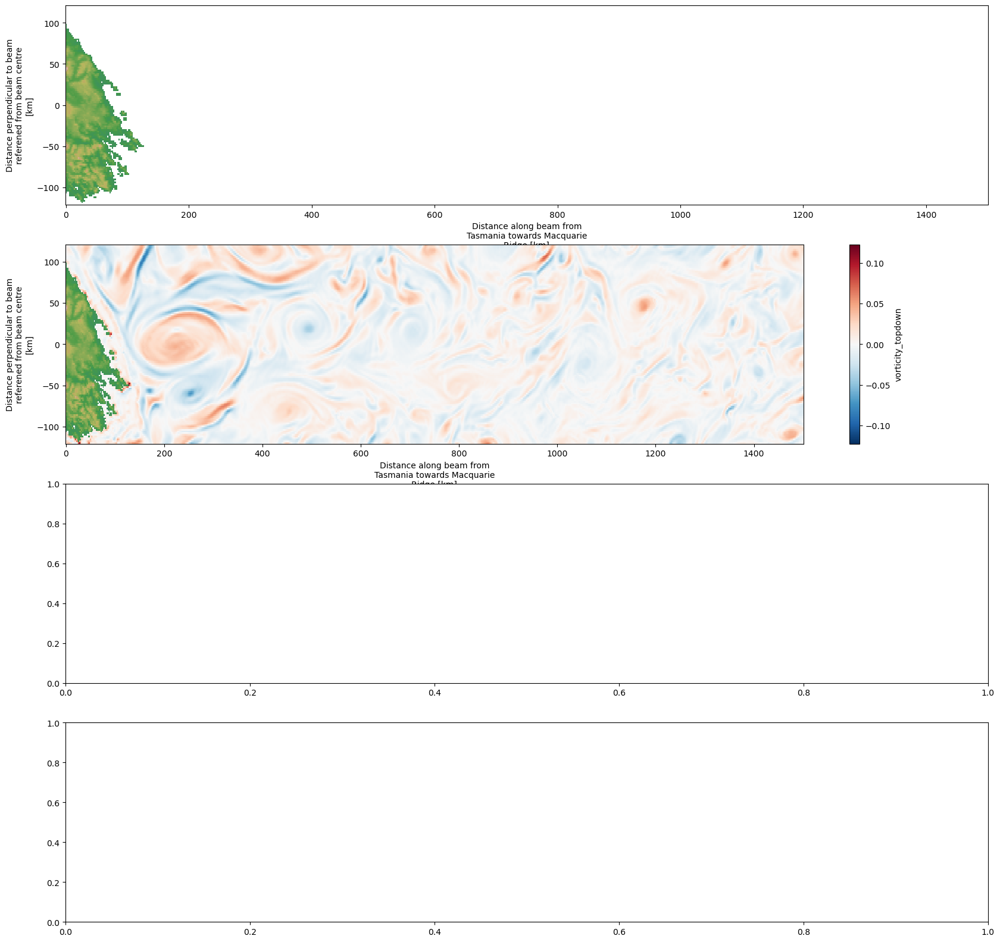

In [10]:
fig,ax = plt.subplots(4,figsize = (20,20))

# cst.plot(ax = ax[0])
tt.plot_topo(ax[0],bathy = to_process["full-40-2"]["data"].bathy)
vorticity.vorticity_topdown.isel(time = 50).plot(ax = ax[1])
tt.plot_topo(ax[1],bathy = to_process["full-40-2"]["data"].bathy)

to_process["full-40-2"]["U"].isel(time = 50).isel(mode = 0).plot(ax = ax[2])
tt.plot_topo(ax[2],bathy = to_process["full-40-2"]["data"].bathy)
to_process["full-40-2"]["U"].isel(time = 50).isel(mode = -1).plot(ax = ax[3],vmin = -1,vmax = 1,cmap = "RdBu_r")
tt.plot_topo(ax[2],bathy = to_process["full-40-2"]["data"].bathy)

for i in ax:
    i.set_xlabel("")

ax[0].set_title("Cross Scale Transfer (Wave to Eddy) Time integral")
ax[1].set_title("Vorticity (snapshot)")
ax[2].set_title("U mode 1 (snapshot)")
ax[3].set_title("U mode 5 (snapshot)")
